In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

# https://arxiv.org/pdf/2006.11239.pdf

import torch
from torch import optim, nn

import json
from tqdm import tqdm
from random import randint

from load_dataset import load_dataset, plot_image, load_contour
from UNet import UNet, UNet_conditional
from torchvision.transforms import v2
from matplotlib import pyplot as plt

device = "cuda"

pimages = load_dataset().to(device)
pimages.shape

with open("labels/pokedex.json") as json_data:
    data = json.load(json_data)

height = [float(str(d['profile']['height']).split()[0]) for d in data]
height = torch.tensor(height, device=device)
#height

types = [d['type'] for d in data]
all_types = list(set([d[0] for d in types]))

def get_index(tp):
    if len(tp) == 1:
        return all_types.index(tp[0]), len(all_types)
    return all_types.index(tp[0]), all_types.index(tp[1])

types = torch.tensor([get_index(t) for t in types], device=device)

contour = load_contour().to(device)
contour.shape

torch.Size([3, 386, 1, 64, 64])

In [2]:
T = 500
beta = torch.linspace(0.01, 0.01, T, device=device)

alpha = 1 - beta

alpha_ = torch.zeros(T, device=device)

for i in range(T):
    alpha_[i] = torch.prod(alpha[0:i+1])

alpha_[-1]

tensor(0.0066, device='cuda:0')

In [3]:
alpha_

tensor([0.9900, 0.9801, 0.9703, 0.9606, 0.9510, 0.9415, 0.9321, 0.9227, 0.9135,
        0.9044, 0.8953, 0.8864, 0.8775, 0.8687, 0.8601, 0.8515, 0.8429, 0.8345,
        0.8262, 0.8179, 0.8097, 0.8016, 0.7936, 0.7857, 0.7778, 0.7700, 0.7623,
        0.7547, 0.7472, 0.7397, 0.7323, 0.7250, 0.7177, 0.7106, 0.7034, 0.6964,
        0.6894, 0.6826, 0.6757, 0.6690, 0.6623, 0.6557, 0.6491, 0.6426, 0.6362,
        0.6298, 0.6235, 0.6173, 0.6111, 0.6050, 0.5990, 0.5930, 0.5870, 0.5812,
        0.5754, 0.5696, 0.5639, 0.5583, 0.5527, 0.5472, 0.5417, 0.5363, 0.5309,
        0.5256, 0.5203, 0.5151, 0.5100, 0.5049, 0.4998, 0.4948, 0.4899, 0.4850,
        0.4801, 0.4753, 0.4706, 0.4659, 0.4612, 0.4566, 0.4520, 0.4475, 0.4430,
        0.4386, 0.4342, 0.4299, 0.4256, 0.4213, 0.4171, 0.4130, 0.4088, 0.4047,
        0.4007, 0.3967, 0.3927, 0.3888, 0.3849, 0.3810, 0.3772, 0.3735, 0.3697,
        0.3660, 0.3624, 0.3587, 0.3552, 0.3516, 0.3481, 0.3446, 0.3412, 0.3378,
        0.3344, 0.3310, 0.3277, 0.3244, 

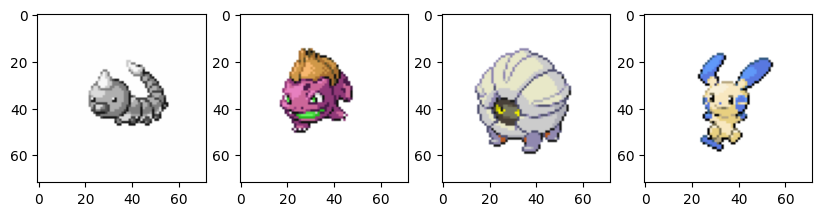

In [4]:
transform = v2.Compose([
    v2.Pad(6, 1.0),
    v2.RandomCrop((64+6, 64+6)),
    v2.Pad(1, 1.0),
    v2.RandomApply([v2.ColorJitter()], 0.2),
    v2.RandomApply([v2.RandomChannelPermutation()], 0.2),
    v2.RandomGrayscale(p = 0.2),
])

source = randint(0, 2)
batch = torch.randperm(385)[:4]
x0 = pimages[source, batch]
x0 = torch.stack([transform(x) for x in x0], dim=0)

fig, axes = plt.subplots(1, 4, figsize=(10, 10))
plot_image(x0[0], axes[0])
plot_image(x0[1], axes[1])
plot_image(x0[2], axes[2])
plot_image(x0[3], axes[3])
plt.show()

In [5]:
def isigmoid(x):
    eps = 0.05
    return torch.log(x + eps) - torch.log(1 - x + eps)

In [6]:
model = UNet_conditional(3, 3, time_dim=512, num_classes=len(all_types) + 1).to(device)

@torch.no_grad
def generate_image():
    model.eval()

    N = 3

    x = torch.randn((N, 3, 72, 72), device=device)

    ty = [["Grass"], ["Fire"], ["Water"]]
    ty = torch.tensor([get_index(t) for t in ty], device=device)
    
    for t in reversed(range(T)):
        tt = torch.tensor([t] * N, device=device)

        z = torch.randn_like(x)
        if t == 0:
            z *= 0

        #x0 = model(x, tt)
        #x = torch.sqrt(alpha_[t]) * x0 + torch.sqrt(1-alpha_[t]) * z

        e = model(x, tt, ty) * (1 - alpha[t]) / torch.sqrt(1 - alpha_[t])
        x = (1 / torch.sqrt(alpha[t])) * (x - e) + z * torch.sqrt(beta[t])
    
    x = torch.sigmoid(x)
    
    fig, axes = plt.subplots(1, N, figsize=(10, 10))
    for i in range(N):
        plot_image(x[i], axes[i])
    plt.show()

    model.train()

In [7]:
#sd = torch.load("model.pt")
#model.load_state_dict(sd)

#generate_image()

  0%|          | 0/100001 [00:00<?, ?it/s]

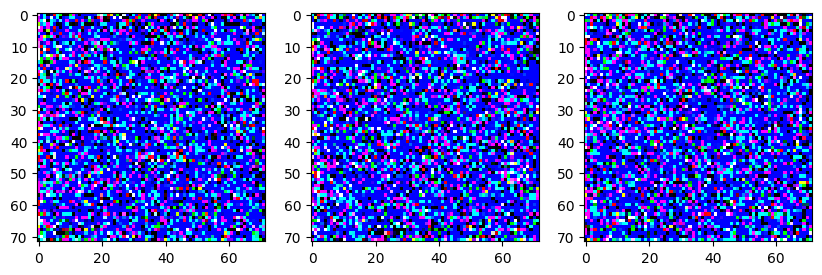

0.07959617:   1%|          | 997/100001 [00:34<51:30, 32.03it/s]  

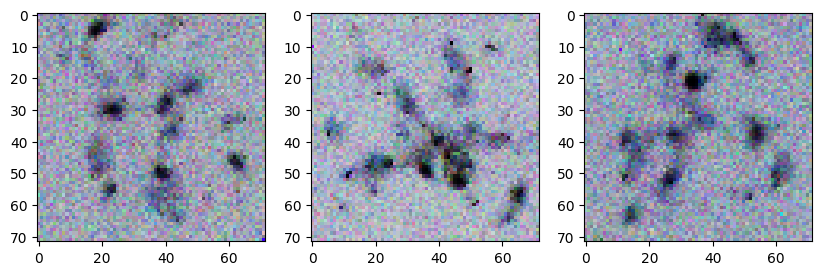

0.02701216:   2%|▏         | 1997/100001 [01:09<51:08, 31.94it/s]  

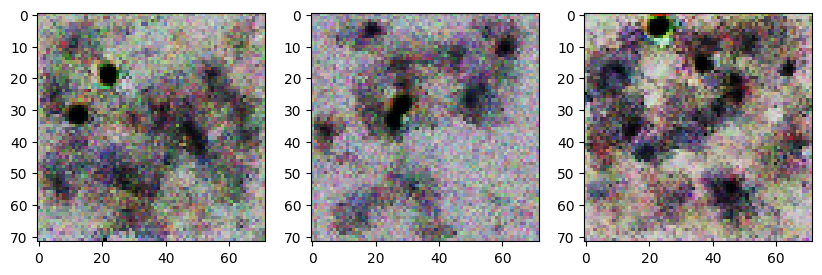

0.03167053:   3%|▎         | 2997/100001 [01:43<50:44, 31.87it/s]  

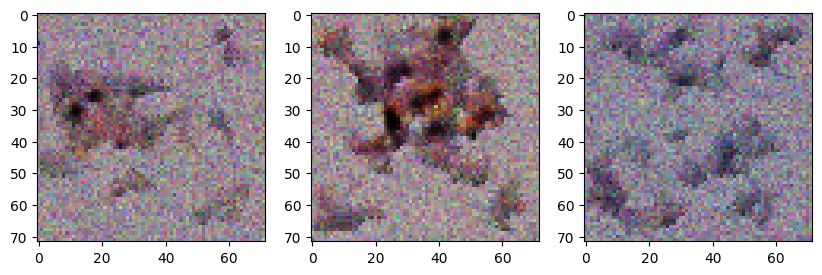

0.03529113:   4%|▍         | 3997/100001 [02:18<50:10, 31.89it/s]  

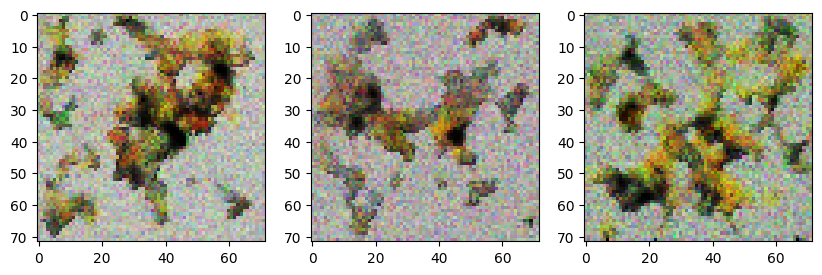

0.07018280:   5%|▍         | 4997/100001 [02:53<49:44, 31.84it/s]  

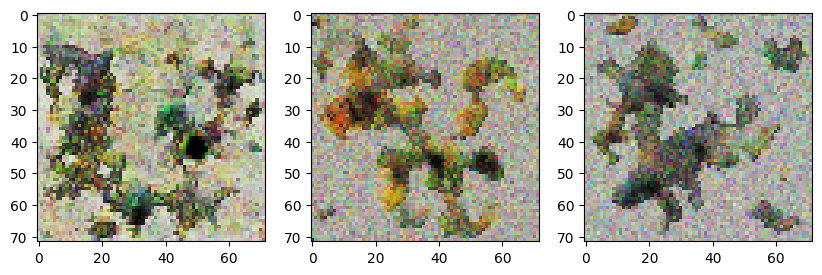

0.08496299:   6%|▌         | 5997/100001 [03:27<49:10, 31.86it/s]  

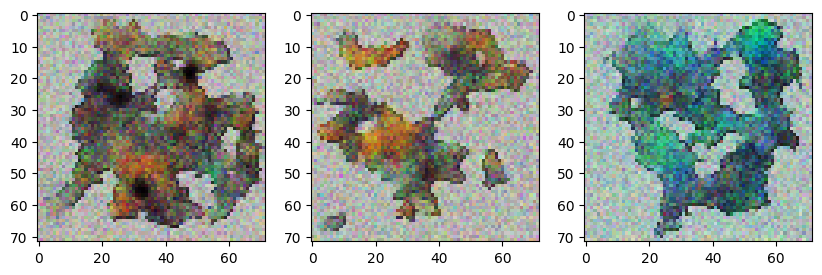

0.05150564:   7%|▋         | 6997/100001 [04:02<48:44, 31.80it/s]  

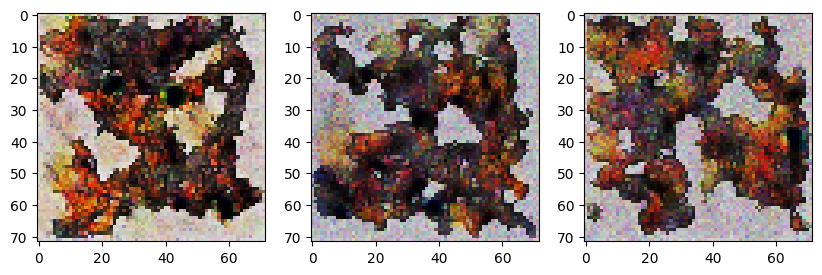

0.02666971:   8%|▊         | 7997/100001 [04:36<48:08, 31.86it/s]  

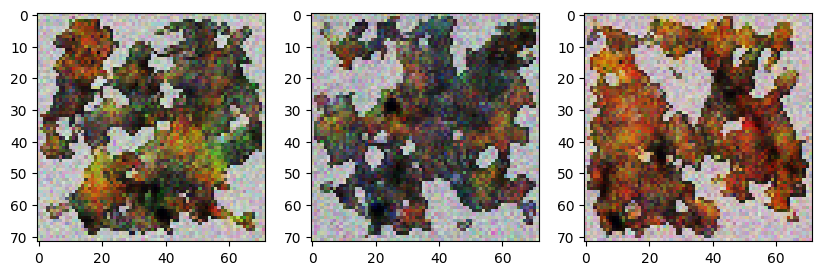

0.04336281:   9%|▉         | 8997/100001 [05:11<47:42, 31.79it/s]  

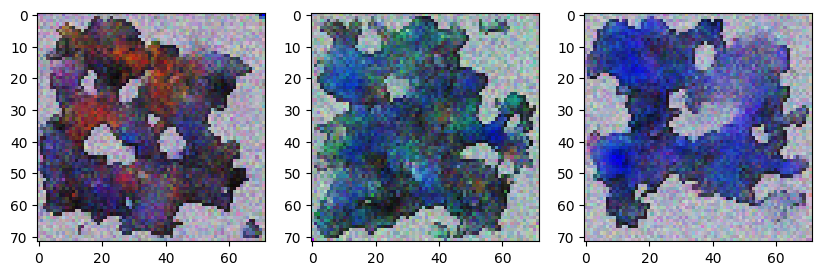

0.03961193:  10%|▉         | 9997/100001 [05:46<47:13, 31.76it/s]  

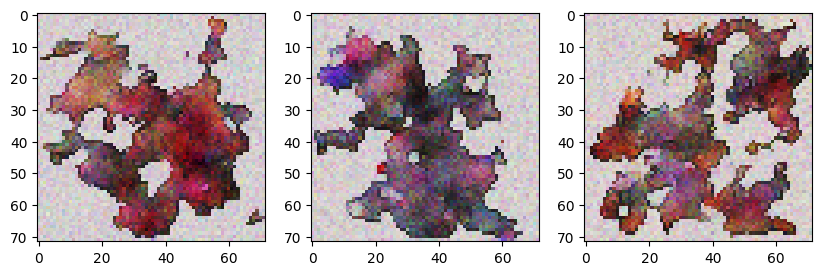

0.02848928:  11%|█         | 10997/100001 [06:20<46:30, 31.89it/s]  

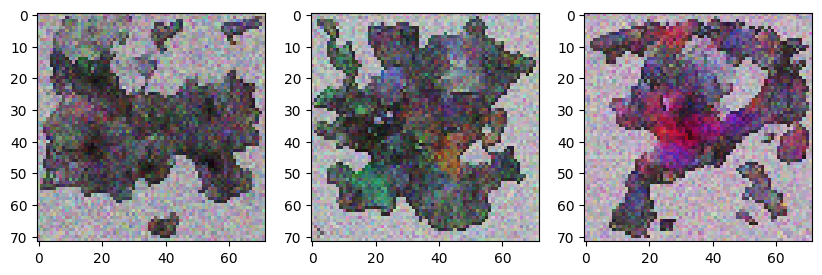

0.02333494:  12%|█▏        | 11997/100001 [06:55<45:53, 31.96it/s]  

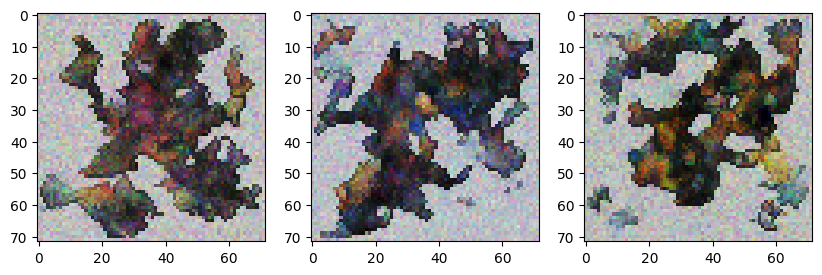

0.05523961:  13%|█▎        | 12997/100001 [07:29<45:34, 31.82it/s]  

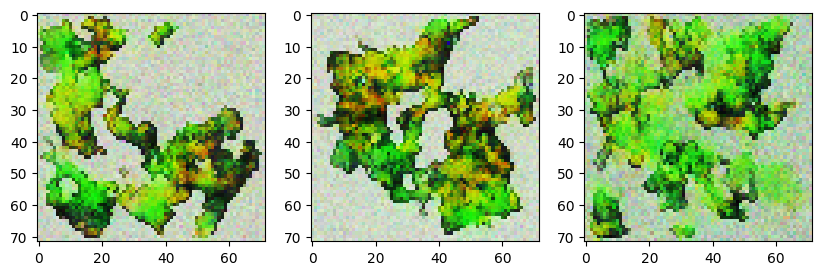

0.03219426:  14%|█▍        | 13997/100001 [08:04<45:01, 31.83it/s]  

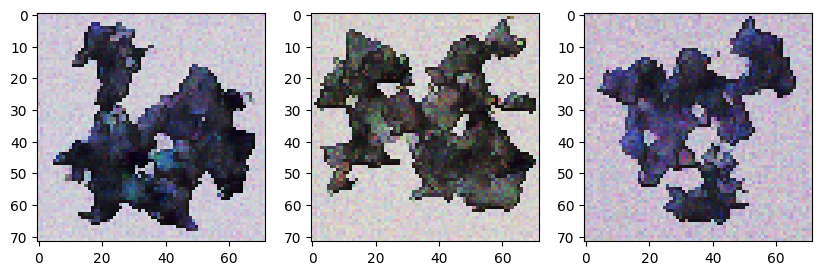

0.04865347:  15%|█▍        | 14997/100001 [08:39<44:24, 31.91it/s]  

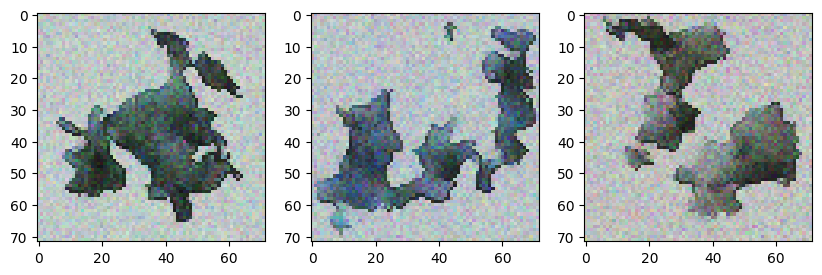

0.03206573:  16%|█▌        | 15997/100001 [09:13<44:05, 31.75it/s]  

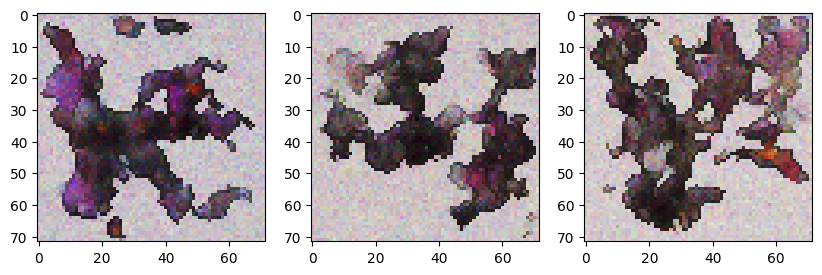

0.01814467:  17%|█▋        | 16997/100001 [09:48<43:25, 31.86it/s]  

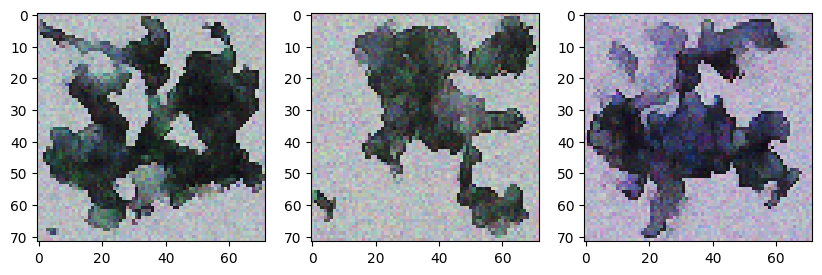

0.03128161:  18%|█▊        | 17997/100001 [10:22<42:50, 31.91it/s]  

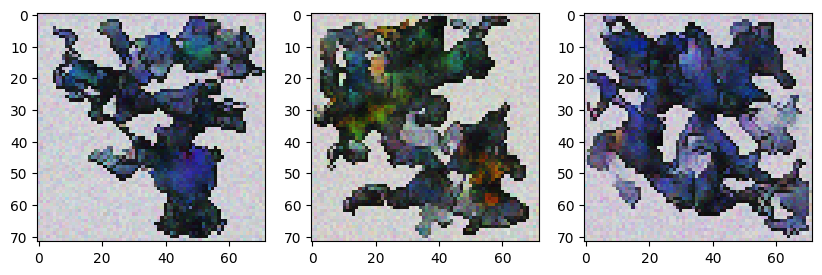

0.03800067:  19%|█▉        | 18997/100001 [10:57<42:24, 31.84it/s]  

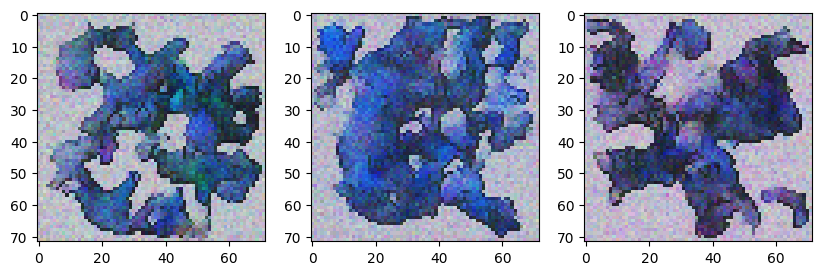

0.02851368:  20%|█▉        | 19997/100001 [11:32<41:52, 31.85it/s]  

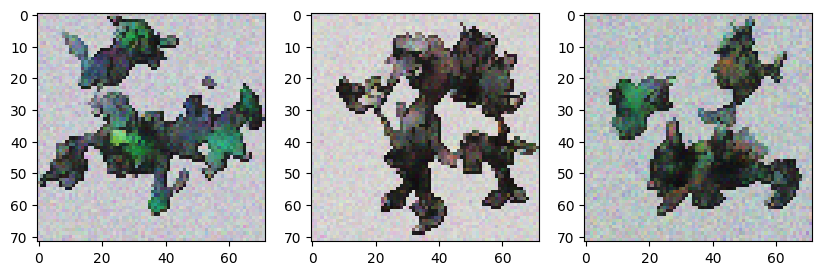

0.02645736:  21%|██        | 20997/100001 [12:06<41:17, 31.88it/s]  

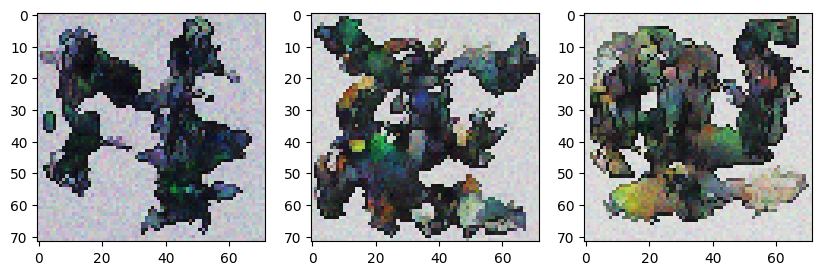

0.03069206:  22%|██▏       | 21997/100001 [12:41<40:52, 31.81it/s]  

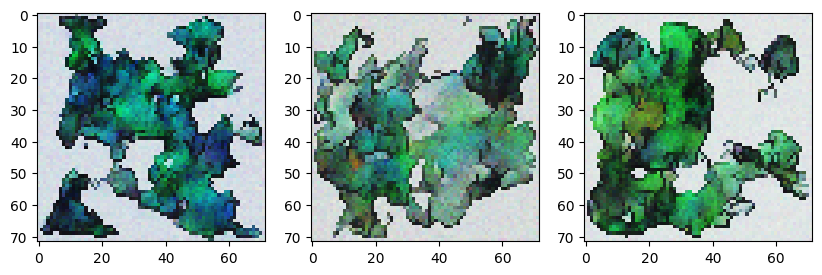

0.03471107:  23%|██▎       | 22997/100001 [13:15<40:16, 31.87it/s]  

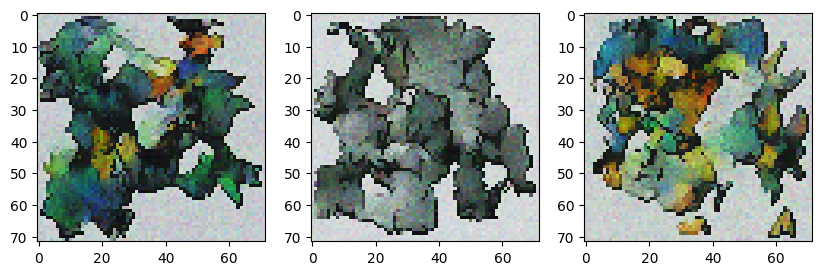

0.02507236:  24%|██▍       | 23997/100001 [13:50<39:46, 31.84it/s]  

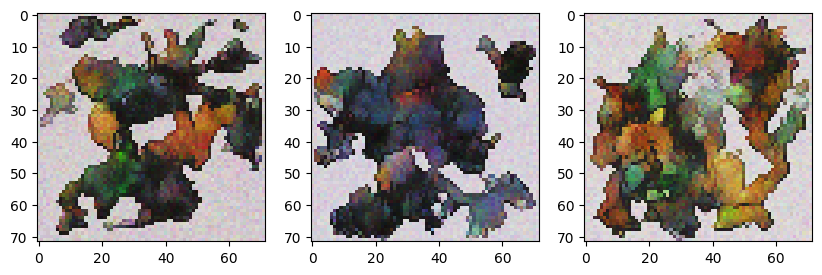

0.03010544:  25%|██▍       | 24997/100001 [14:25<39:13, 31.86it/s]  

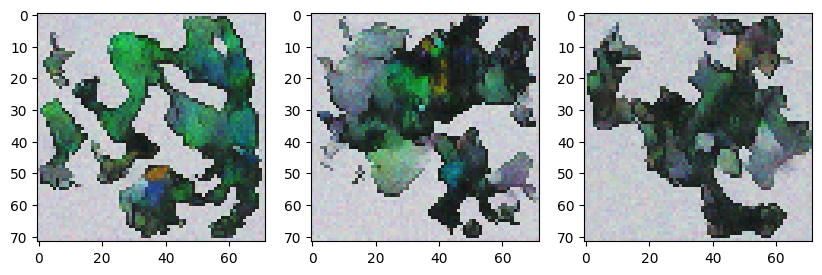

0.03142020:  26%|██▌       | 25997/100001 [14:59<38:39, 31.91it/s]  

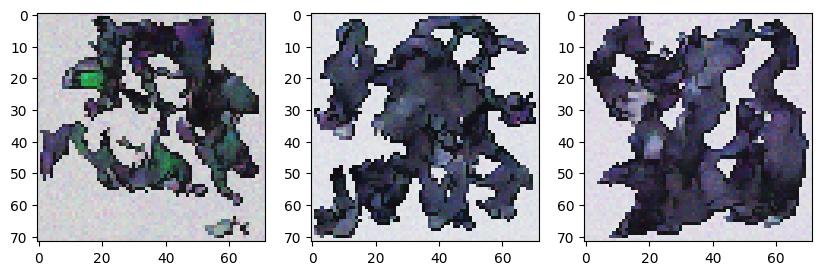

0.02095757:  27%|██▋       | 26997/100001 [15:34<38:11, 31.85it/s]  

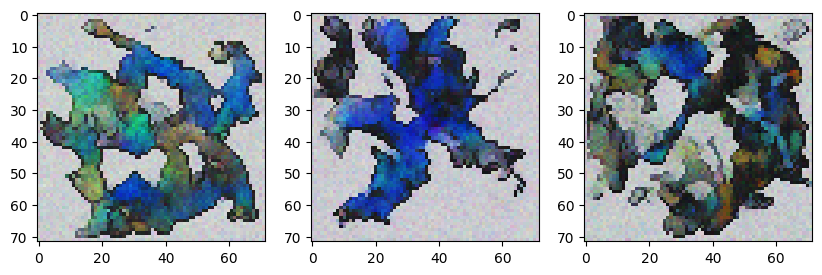

0.01656921:  28%|██▊       | 27997/100001 [16:09<37:43, 31.81it/s]  

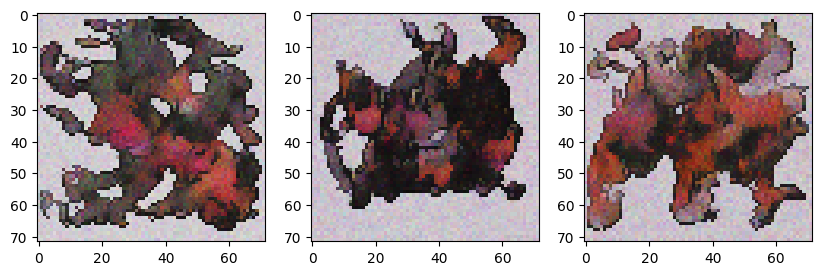

0.02745899:  29%|██▉       | 28997/100001 [16:43<37:12, 31.80it/s]  

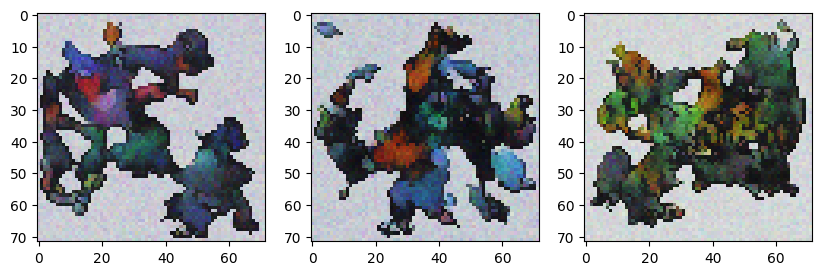

0.03671312:  30%|██▉       | 29997/100001 [17:18<36:40, 31.82it/s]  

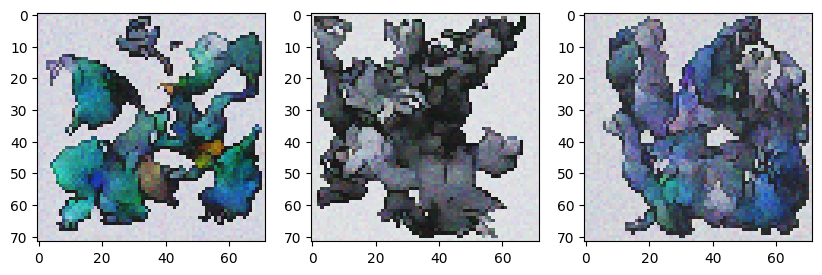

0.02370591:  31%|███       | 30997/100001 [17:52<36:08, 31.82it/s]  

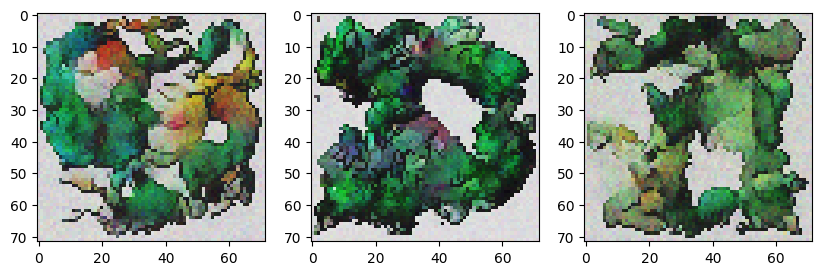

0.02669026:  32%|███▏      | 31997/100001 [18:27<35:34, 31.85it/s]  

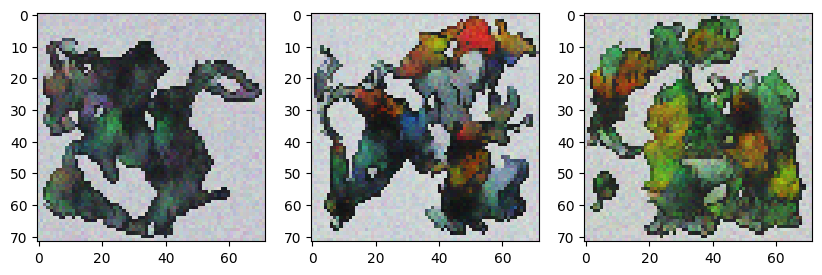

0.03619032:  33%|███▎      | 33000/100001 [19:02<35:05, 31.82it/s]  

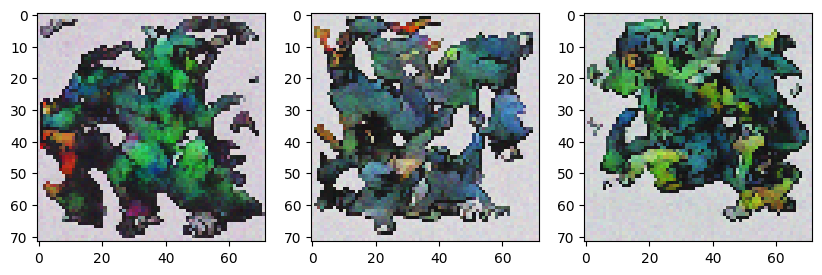

0.02379636:  34%|███▍      | 34000/100001 [19:36<34:37, 31.77it/s]  

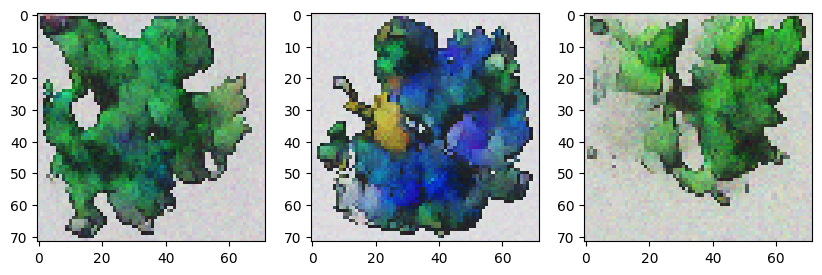

0.04197658:  35%|███▍      | 35000/100001 [20:11<34:01, 31.84it/s]  

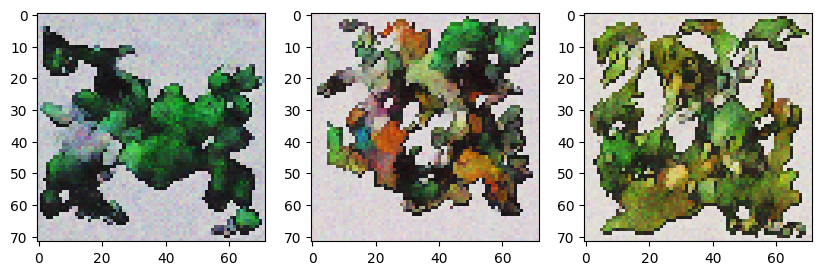

0.03533745:  36%|███▌      | 36000/100001 [20:46<33:30, 31.84it/s]  

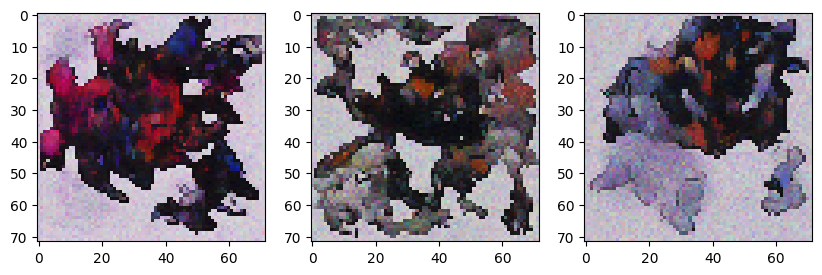

0.02868449:  37%|███▋      | 37000/100001 [21:20<33:02, 31.78it/s]  

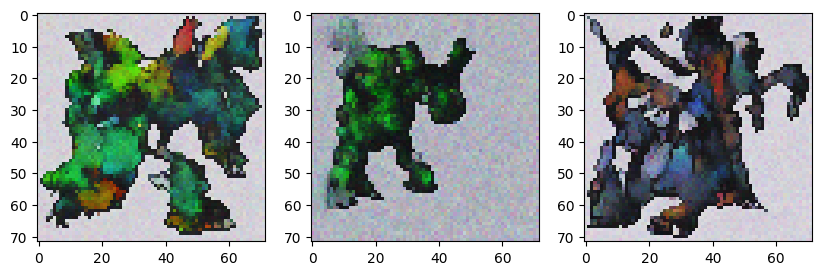

0.03883957:  38%|███▊      | 38000/100001 [21:55<32:24, 31.89it/s]  

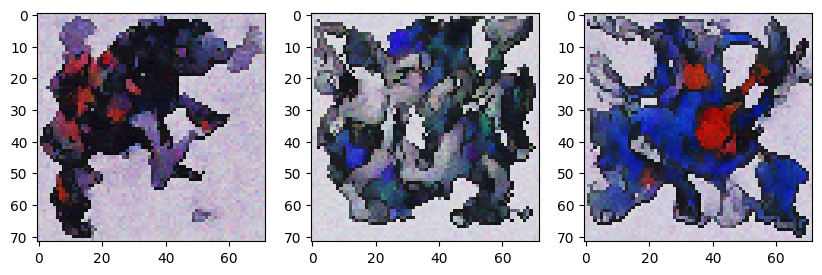

0.02448795:  39%|███▉      | 39000/100001 [22:29<31:55, 31.85it/s]  

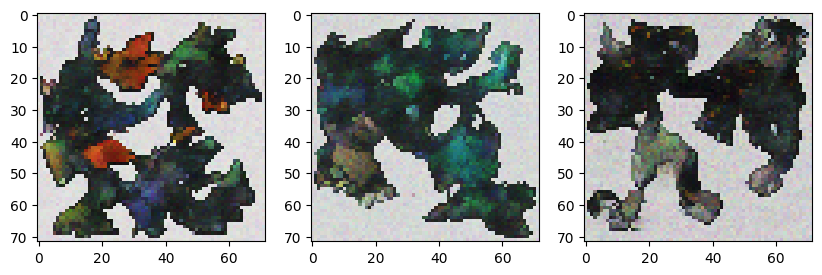

0.04939763:  40%|███▉      | 40000/100001 [23:04<31:22, 31.88it/s]  

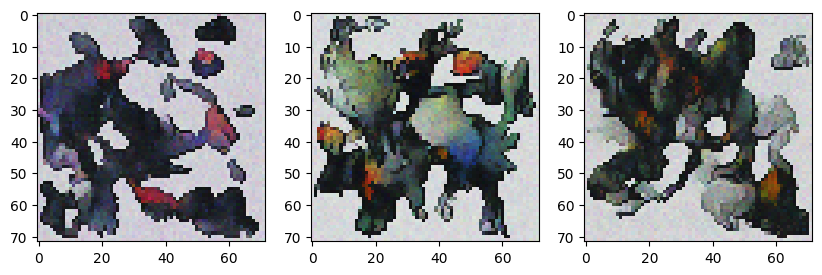

0.02409559:  41%|████      | 41000/100001 [23:39<30:54, 31.81it/s]  

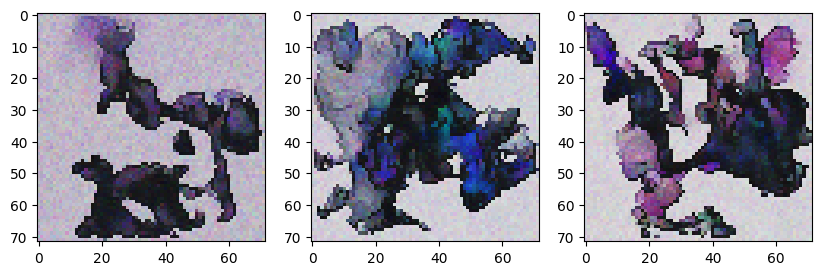

0.02807646:  42%|████▏     | 42000/100001 [24:13<30:20, 31.86it/s]  

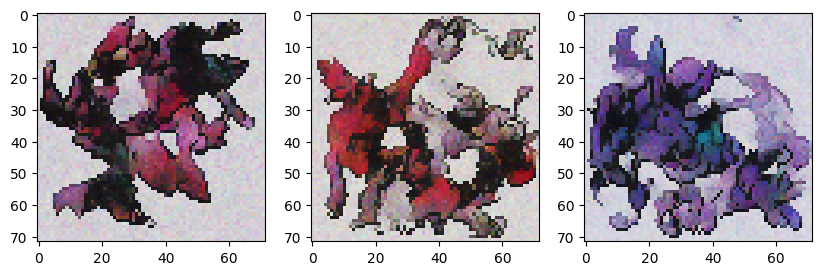

0.06105475:  43%|████▎     | 43000/100001 [24:48<29:51, 31.82it/s]  

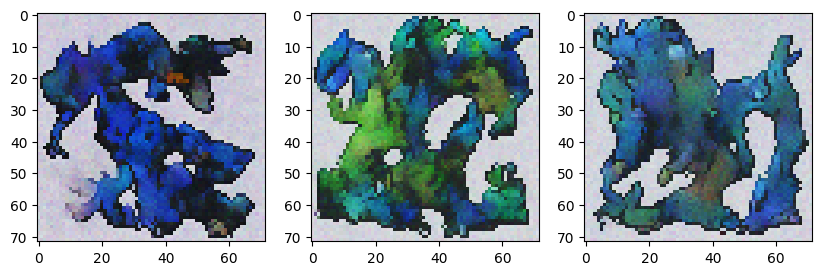

0.03558551:  44%|████▍     | 44000/100001 [25:23<29:15, 31.90it/s]  

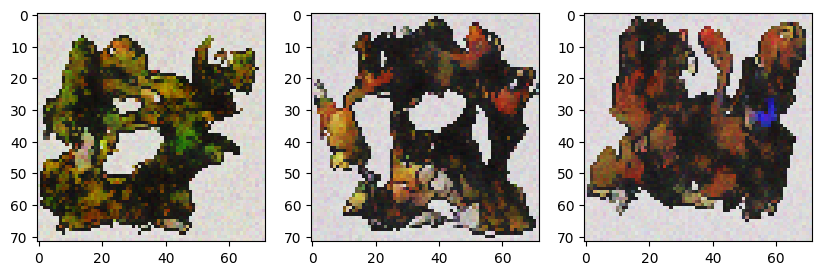

0.01531476:  45%|████▍     | 45000/100001 [25:57<28:45, 31.87it/s]  

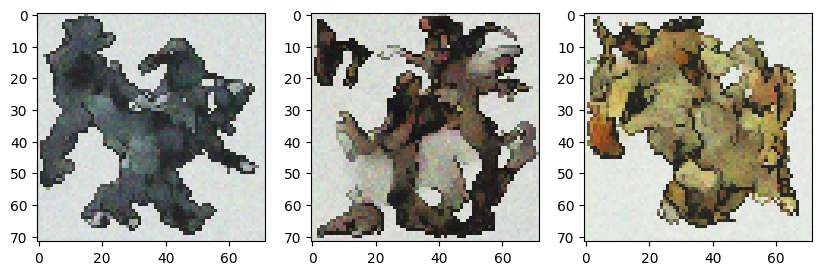

0.04672272:  46%|████▌     | 46000/100001 [26:32<28:16, 31.83it/s]  

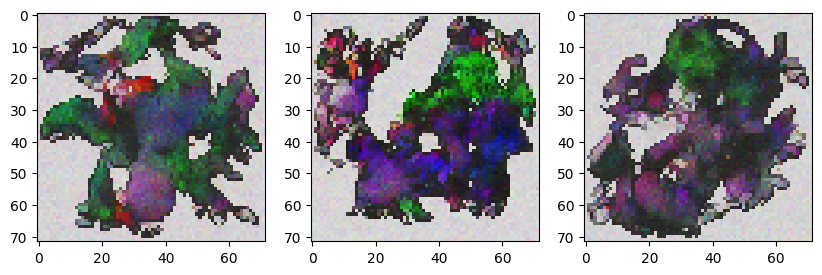

0.02378196:  47%|████▋     | 47000/100001 [27:07<27:46, 31.81it/s]  

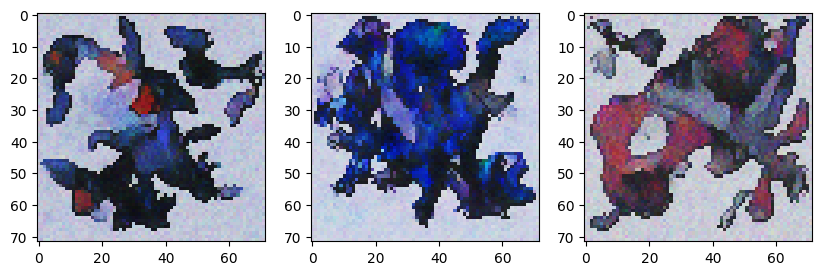

0.01891855:  48%|████▊     | 48000/100001 [27:41<27:16, 31.78it/s]  

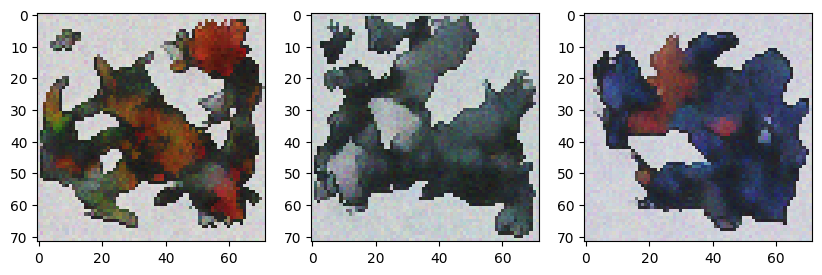

0.01651303:  49%|████▉     | 49000/100001 [28:16<26:41, 31.84it/s]  

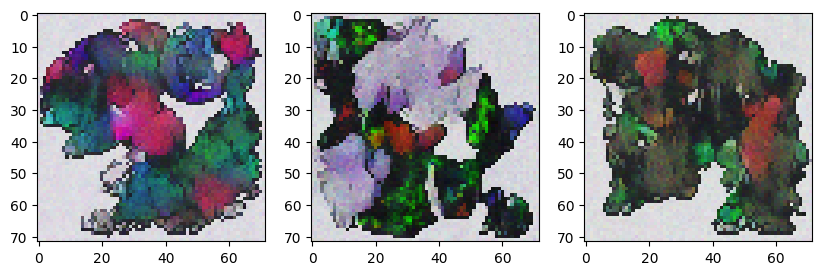

0.02403397:  50%|████▉     | 50000/100001 [28:50<26:09, 31.85it/s]  

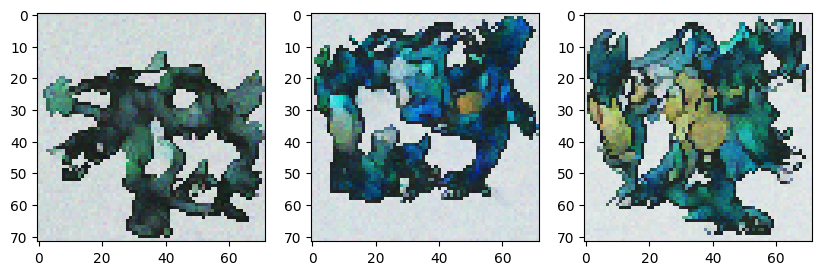

0.02522670:  51%|█████     | 51000/100001 [29:25<25:42, 31.77it/s]  

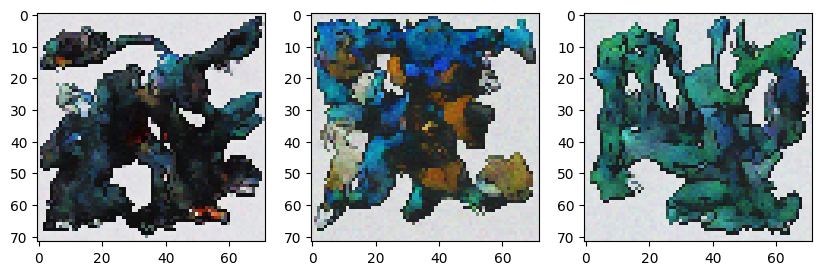

0.02437834:  52%|█████▏    | 52000/100001 [30:00<25:06, 31.86it/s]  

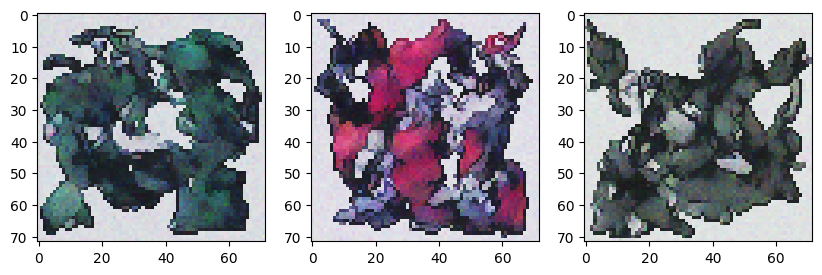

0.02081911:  53%|█████▎    | 53000/100001 [30:34<24:32, 31.91it/s]  

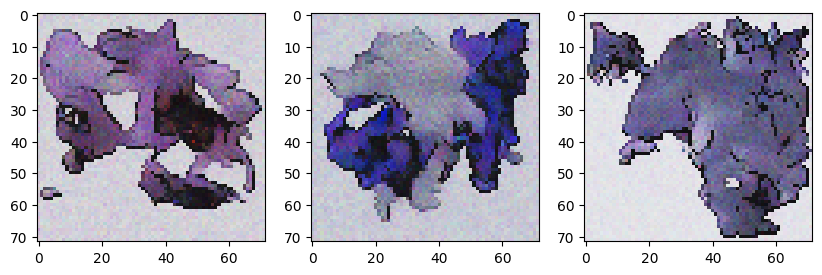

0.04279053:  54%|█████▍    | 54000/100001 [31:09<24:02, 31.88it/s]  

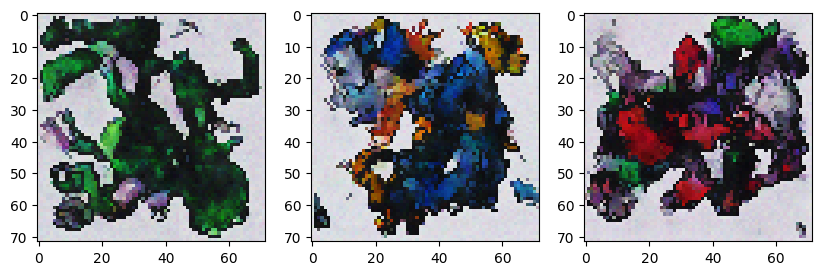

0.03219045:  55%|█████▍    | 55000/100001 [31:44<23:32, 31.85it/s]  

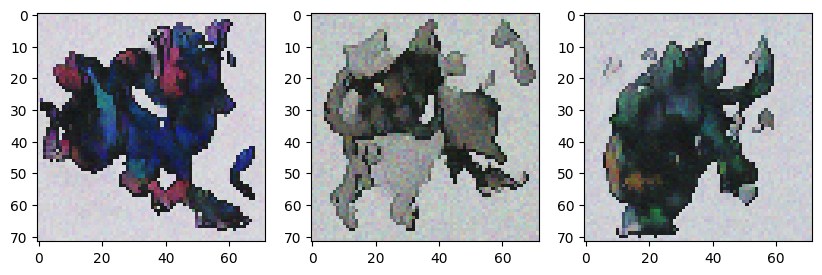

0.01969036:  56%|█████▌    | 56000/100001 [32:18<23:01, 31.84it/s]  

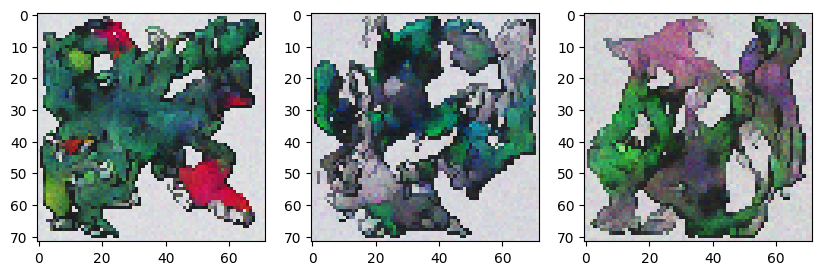

0.03646585:  57%|█████▋    | 57000/100001 [32:53<22:32, 31.80it/s]  

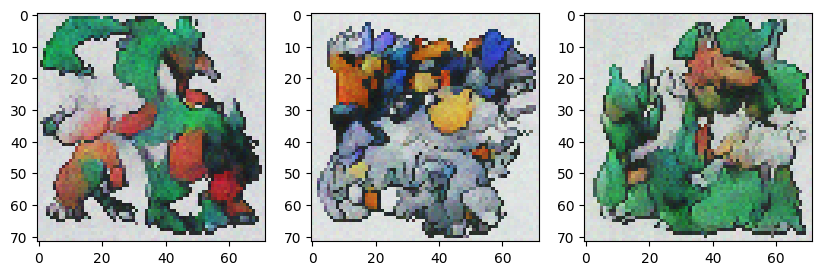

0.02453798:  58%|█████▊    | 58000/100001 [33:27<22:01, 31.79it/s]  

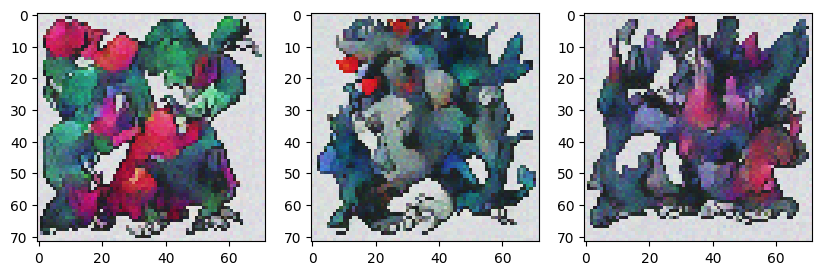

0.03761100:  59%|█████▉    | 59000/100001 [34:02<21:27, 31.83it/s]  

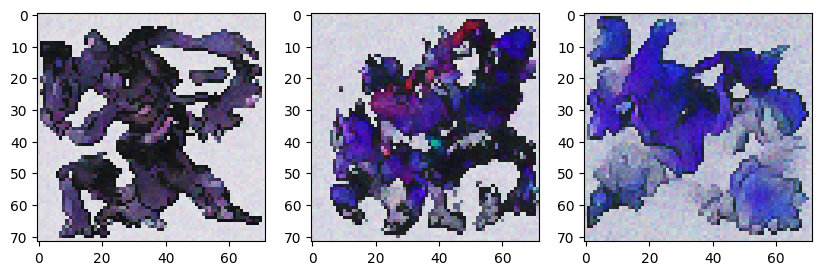

0.03258255:  60%|█████▉    | 60000/100001 [34:37<20:57, 31.82it/s]  

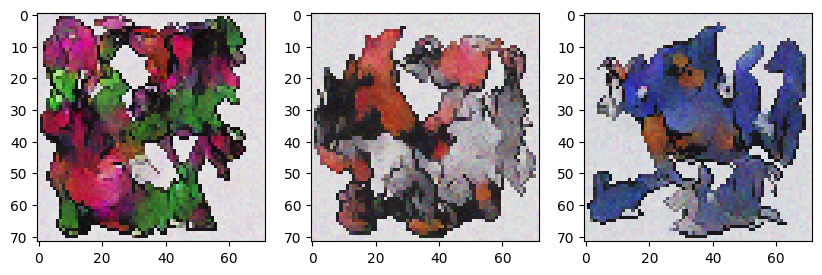

0.02614159:  61%|██████    | 61000/100001 [35:11<20:24, 31.85it/s]  

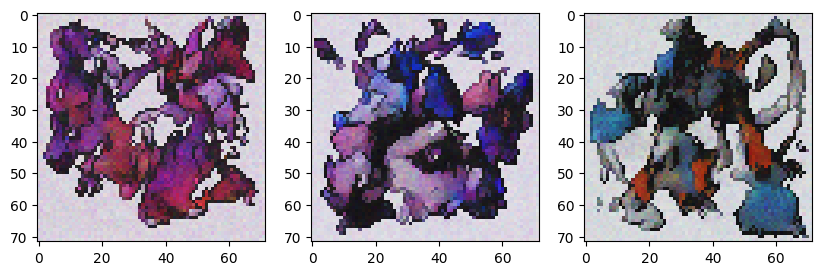

0.03089728:  62%|██████▏   | 62000/100001 [35:46<19:55, 31.79it/s]  

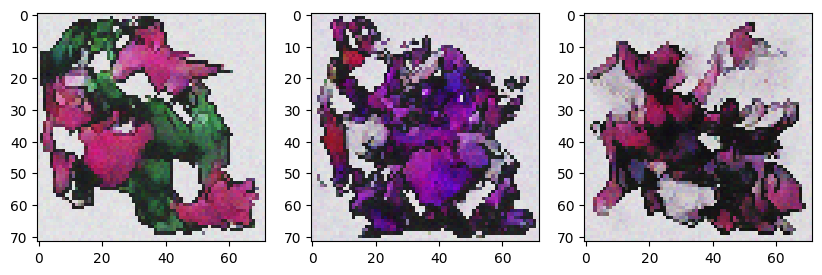

0.03046616:  63%|██████▎   | 63000/100001 [36:21<19:27, 31.68it/s]  

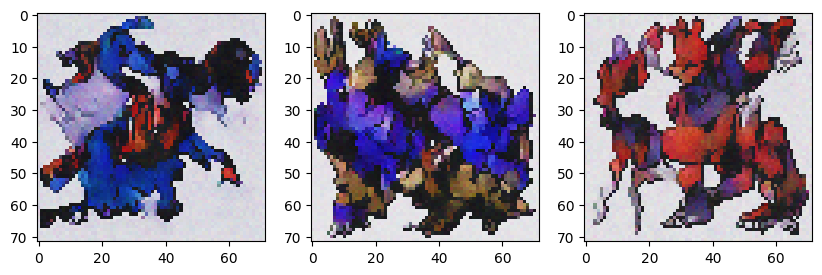

0.02330563:  64%|██████▍   | 64000/100001 [36:55<18:51, 31.82it/s]  

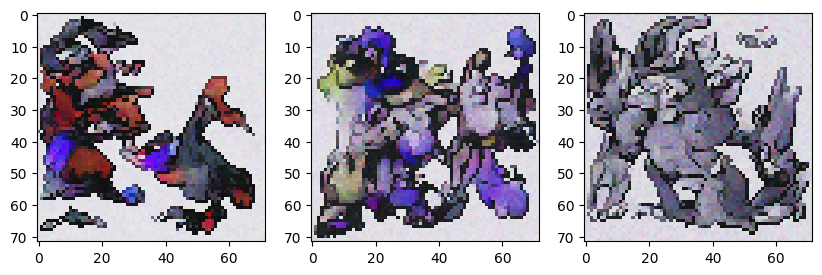

0.02764960:  65%|██████▍   | 65000/100001 [37:30<18:15, 31.94it/s]  

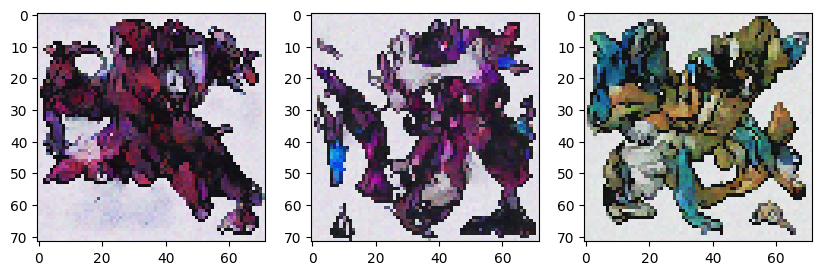

0.02908811:  66%|██████▌   | 66000/100001 [38:05<17:48, 31.82it/s]  

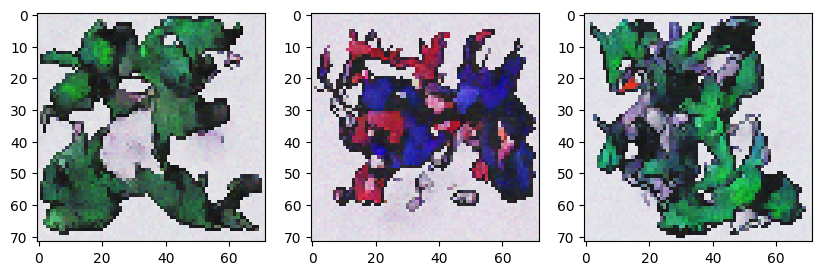

0.01707078:  67%|██████▋   | 67000/100001 [38:39<17:09, 32.06it/s]  

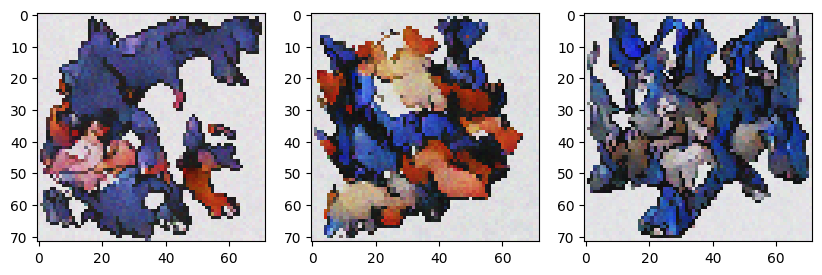

0.03254739:  68%|██████▊   | 68000/100001 [39:14<16:47, 31.78it/s]  

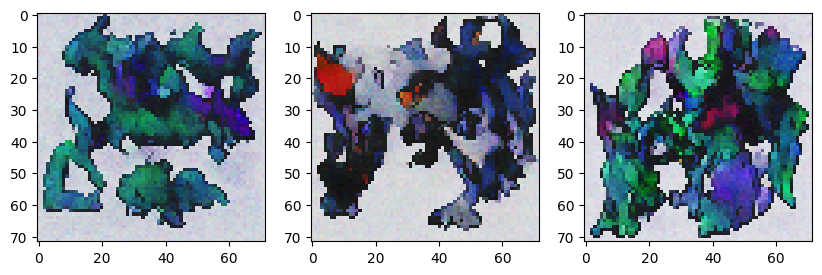

0.02201155:  69%|██████▉   | 69000/100001 [39:48<16:13, 31.83it/s]  

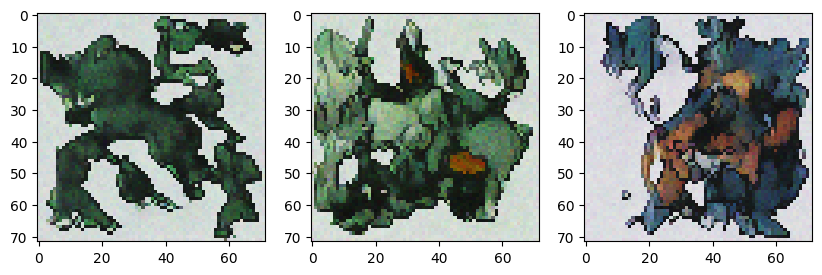

0.02544791:  70%|██████▉   | 70000/100001 [40:23<15:41, 31.88it/s]  

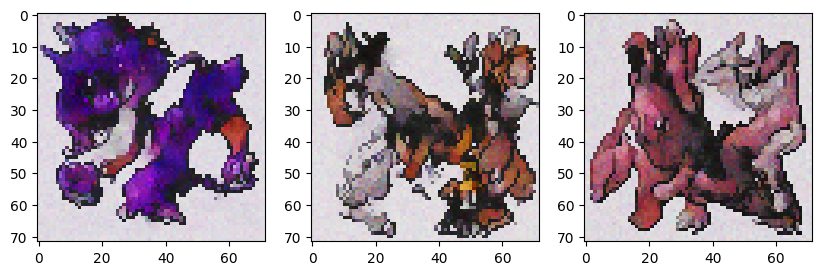

0.02656101:  71%|███████   | 71000/100001 [40:58<15:11, 31.82it/s]  

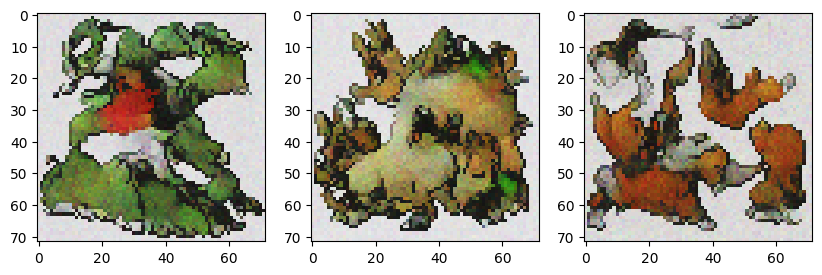

0.03778203:  72%|███████▏  | 72000/100001 [41:32<14:38, 31.88it/s]  

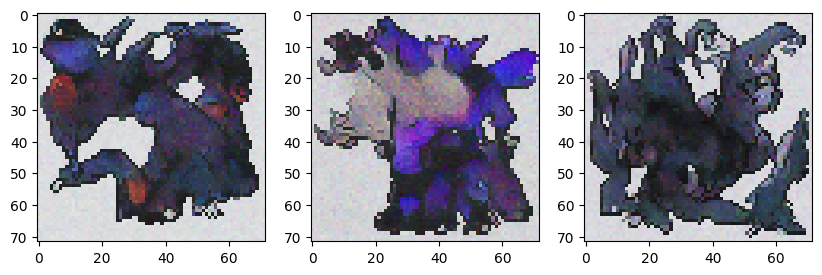

0.03367003:  73%|███████▎  | 73000/100001 [42:07<14:09, 31.80it/s]  

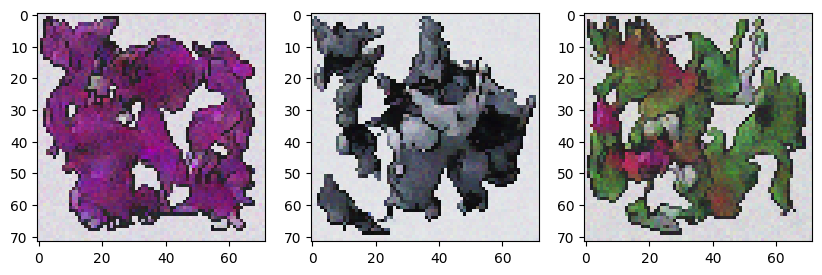

0.02571184:  74%|███████▍  | 74000/100001 [42:42<13:37, 31.82it/s]  

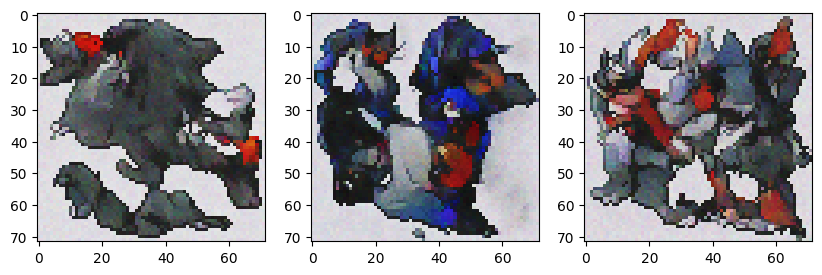

0.02547815:  75%|███████▍  | 75000/100001 [43:16<13:06, 31.78it/s]  

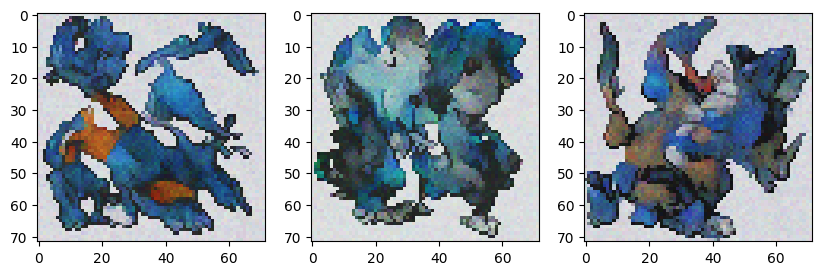

0.01648409:  76%|███████▌  | 76000/100001 [43:51<12:40, 31.55it/s]  

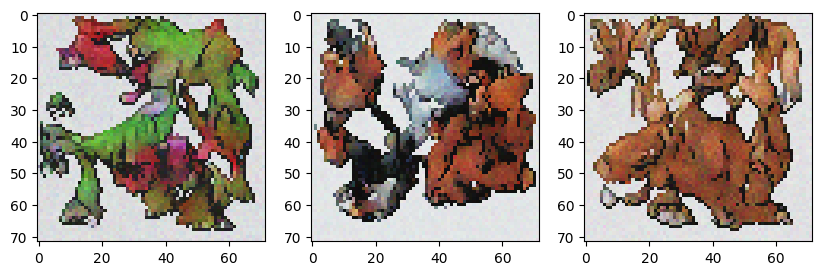

0.02571798:  77%|███████▋  | 77000/100001 [44:26<12:04, 31.73it/s]  

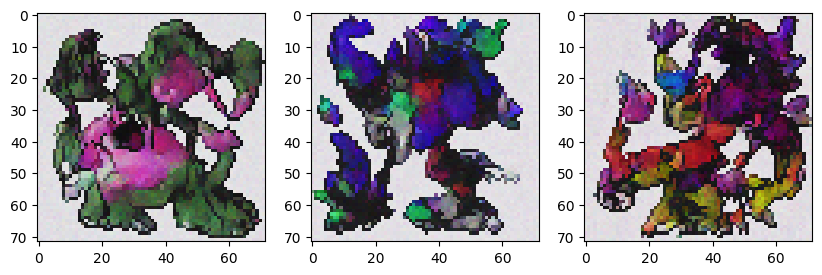

0.02160034:  78%|███████▊  | 78000/100001 [45:00<11:31, 31.80it/s]  

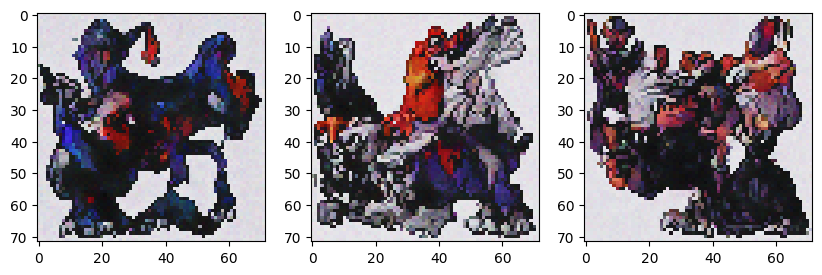

0.01723338:  79%|███████▉  | 79000/100001 [45:35<10:58, 31.88it/s]  

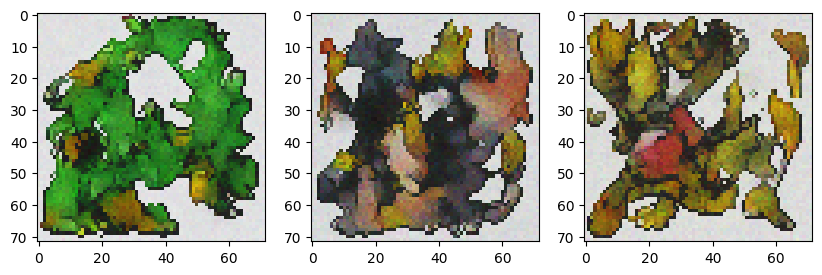

0.02689568:  80%|███████▉  | 80000/100001 [46:10<10:26, 31.94it/s]  

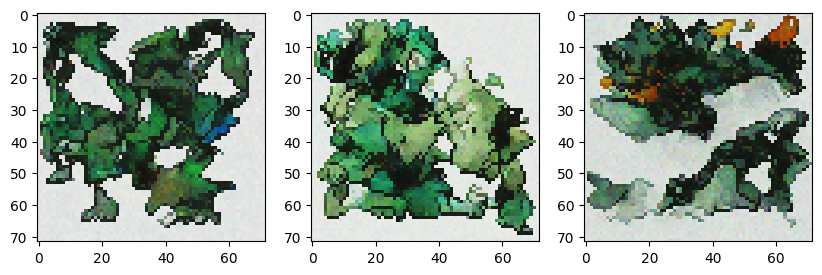

0.02947000:  81%|████████  | 81000/100001 [46:45<09:55, 31.92it/s]  

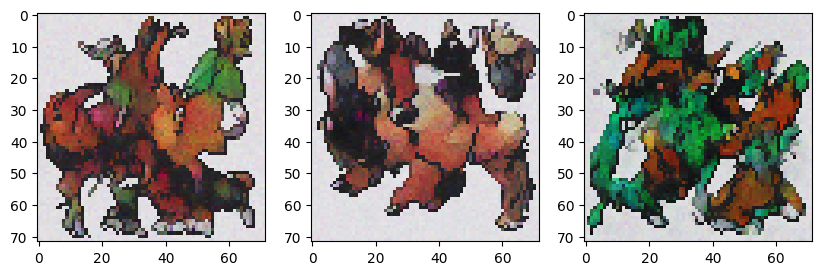

0.02395392:  82%|████████▏ | 82000/100001 [47:19<09:25, 31.85it/s]  

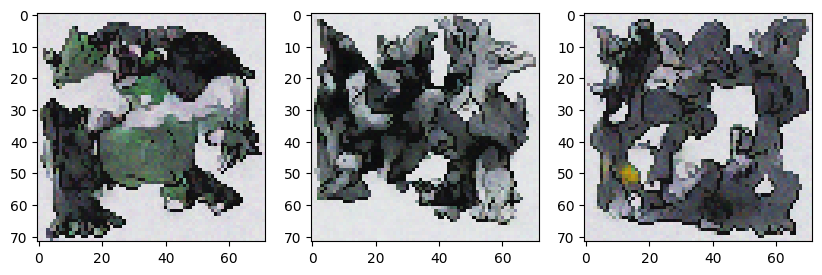

0.02640562:  83%|████████▎ | 83000/100001 [47:54<08:53, 31.88it/s]  

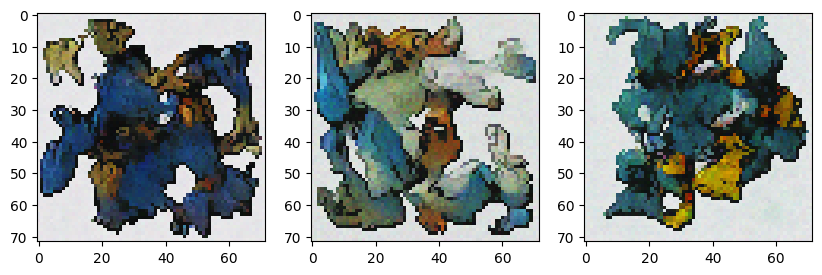

0.02201663:  84%|████████▍ | 84000/100001 [48:29<08:22, 31.82it/s]  

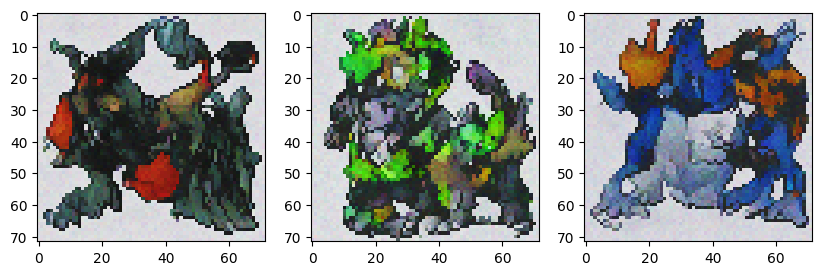

0.01988454:  85%|████████▍ | 85000/100001 [49:03<07:50, 31.87it/s]  

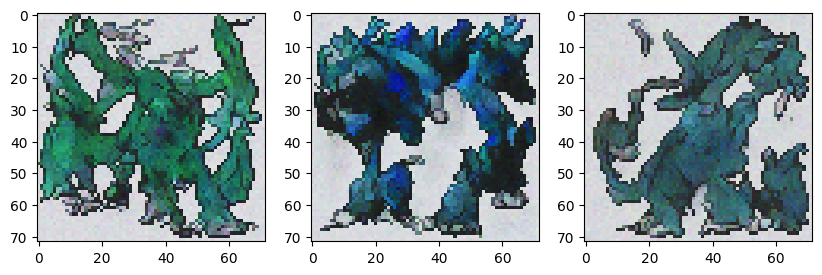

0.02825633:  86%|████████▌ | 86000/100001 [49:38<07:22, 31.66it/s]  

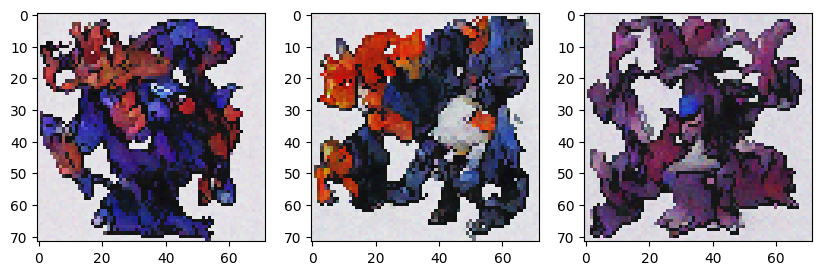

0.02411557:  87%|████████▋ | 87000/100001 [50:13<06:48, 31.84it/s]  

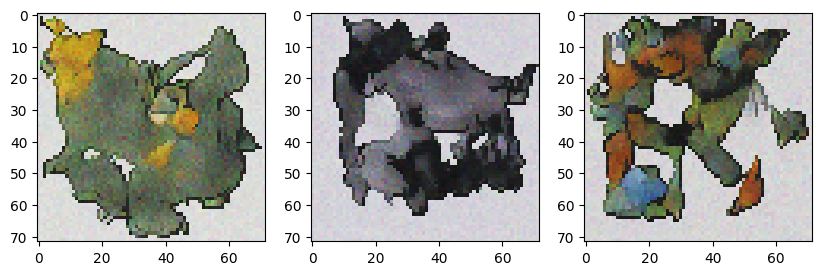

0.01954921:  88%|████████▊ | 88000/100001 [50:47<06:17, 31.82it/s]

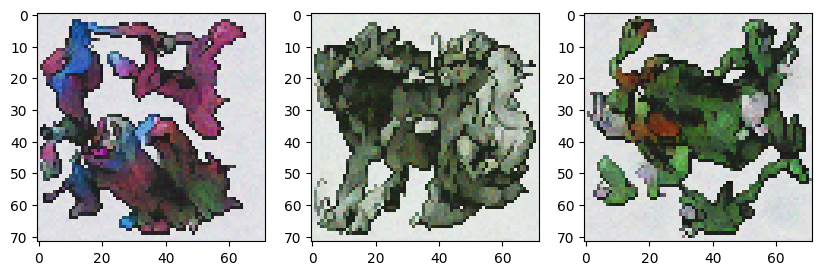

0.01834282:  89%|████████▉ | 89000/100001 [51:22<05:44, 31.93it/s]

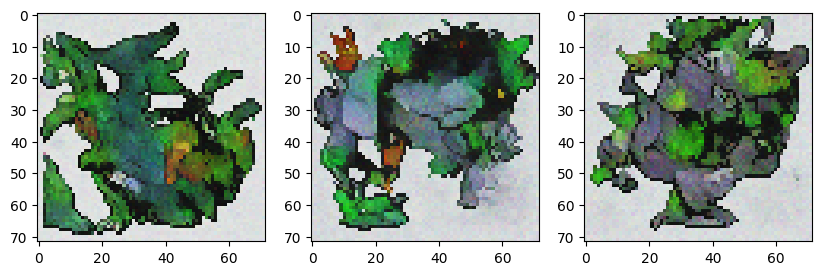

0.03304802:  90%|████████▉ | 90000/100001 [51:57<05:12, 31.96it/s]

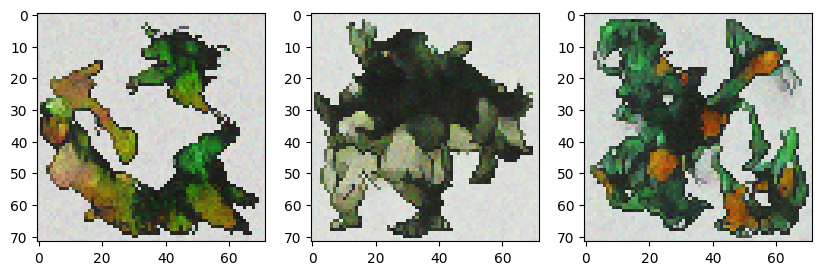

0.02975919:  91%|█████████ | 91000/100001 [52:31<04:42, 31.85it/s]

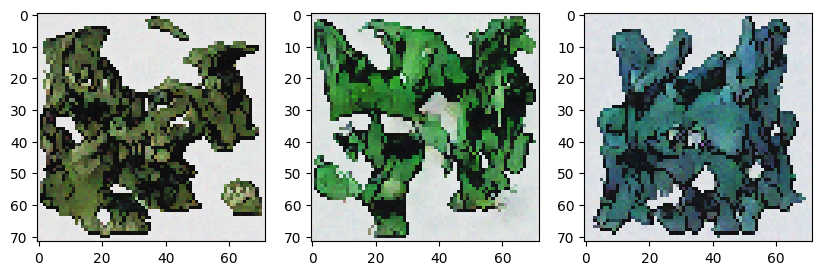

0.01955039:  92%|█████████▏| 92000/100001 [53:06<04:11, 31.81it/s]

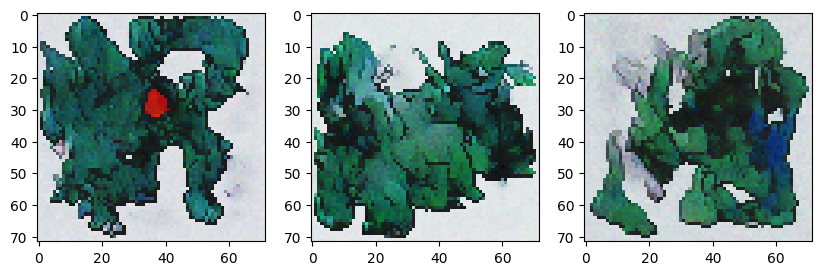

0.02256050:  93%|█████████▎| 93000/100001 [53:40<03:39, 31.84it/s]

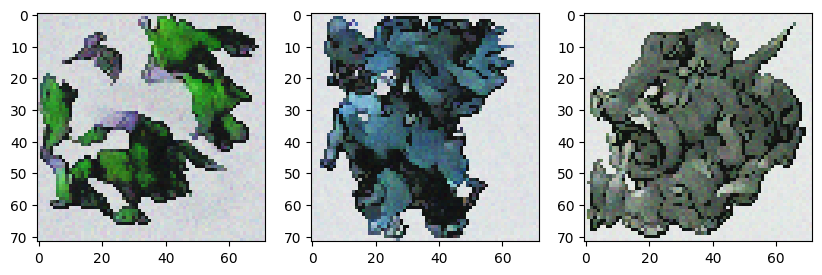

0.01891982:  94%|█████████▍| 94000/100001 [54:15<03:08, 31.86it/s]

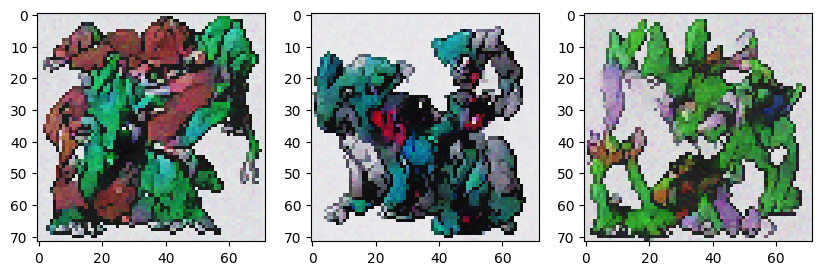

0.02791739:  95%|█████████▍| 95000/100001 [54:50<02:36, 31.87it/s]

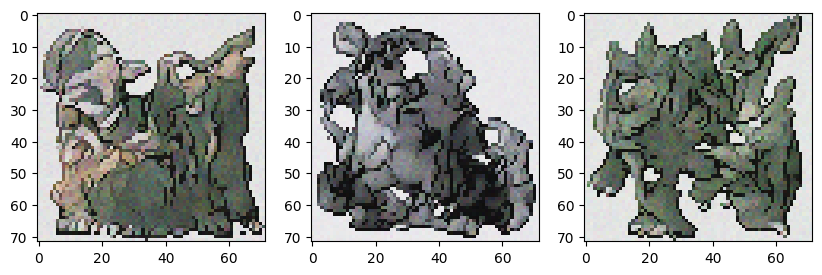

0.03210299:  96%|█████████▌| 96000/100001 [55:24<02:05, 31.89it/s]

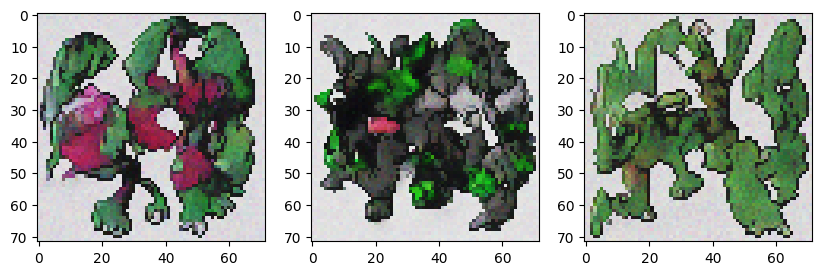

0.01793322:  97%|█████████▋| 97000/100001 [55:59<01:34, 31.91it/s]

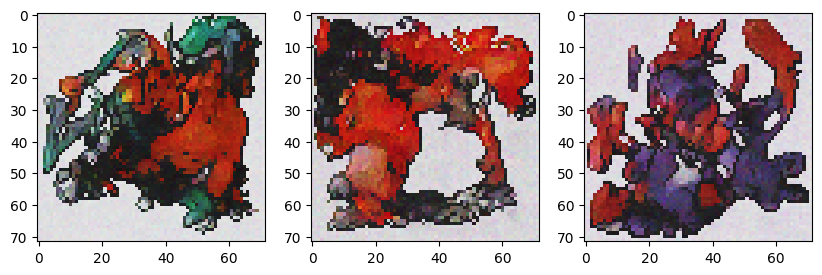

0.02066590:  98%|█████████▊| 98000/100001 [56:34<01:02, 31.87it/s]

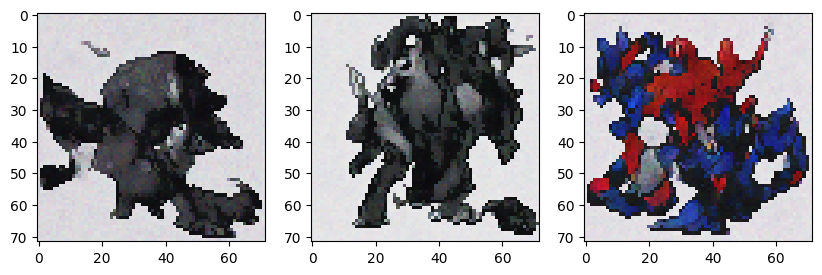

0.03710265:  99%|█████████▉| 99000/100001 [57:08<00:31, 31.85it/s]

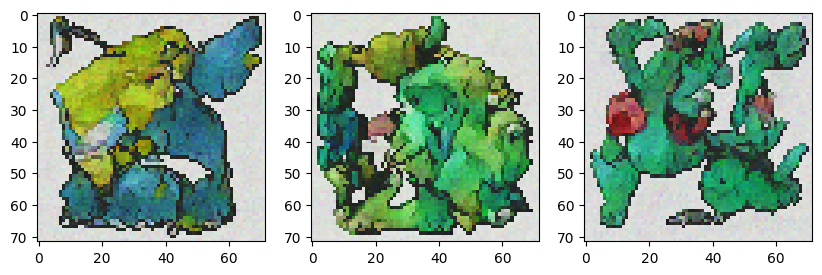

0.02123016: 100%|█████████▉| 100000/100001 [57:43<00:00, 31.85it/s]

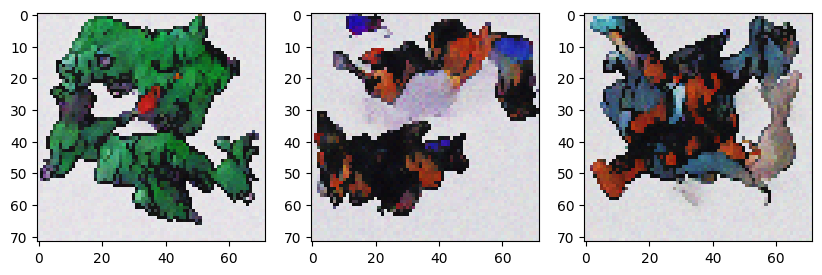

0.01393124: 100%|██████████| 100001/100001 [57:46<00:00, 28.85it/s]


In [8]:
loss_func = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
    
pbar = tqdm(range(100001))
def closure():
    optimizer.zero_grad()

    bs = 8

    source = randint(0, 2)
    batch = torch.randperm(385)[:bs]
    x0 = pimages[source, batch]
    x0 = torch.stack([transform(x) for x in x0], dim=0)
    x0 = isigmoid(x0)

    ty = types[batch]
    
    e = torch.randn_like(x0)
    t = torch.randint(0, T - 1, (bs,), device=device)

    xt = torch.sqrt(alpha_[t])[:, None, None, None] * x0 + torch.sqrt(1-alpha_[t])[:, None, None, None] * e
    ep = model(xt, t, ty)

    loss = loss_func(ep, e)
    loss.backward()
    
    pbar.set_description(f"%.8f" % loss, refresh=False)
    
    return loss

model.train()
for j in pbar:
    optimizer.step(closure)

    if j % 1000 == 0:
        generate_image()

torch.save(model.state_dict(), 'model.pt')